In [1]:
import os
import scanpy as sc
import numpy as np
import pandas as pd
import torch
from anndata import AnnData
import seaborn as sns
import matplotlib.pyplot as plt

import scSLAT
from scSLAT.model import Cal_Spatial_Net, load_anndatas, run_SLAT, scanpy_workflow, spatial_match
from scSLAT.viz import match_3D_multi, hist, match_3D_celltype, Sankey
from scSLAT.metrics import region_statistics

/rd2/user/xiacr/SLAT/conda/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
sc.set_figure_params(dpi=150, dpi_save=150, transparent=True, facecolor=(1,1,1,1))

In [11]:
adata1_filter = sc.read_h5ad('./seqFISH_filer.h5ad')
adata2 = sc.read_h5ad('./Stereo_filer.h5ad')

# Filter and pre-match

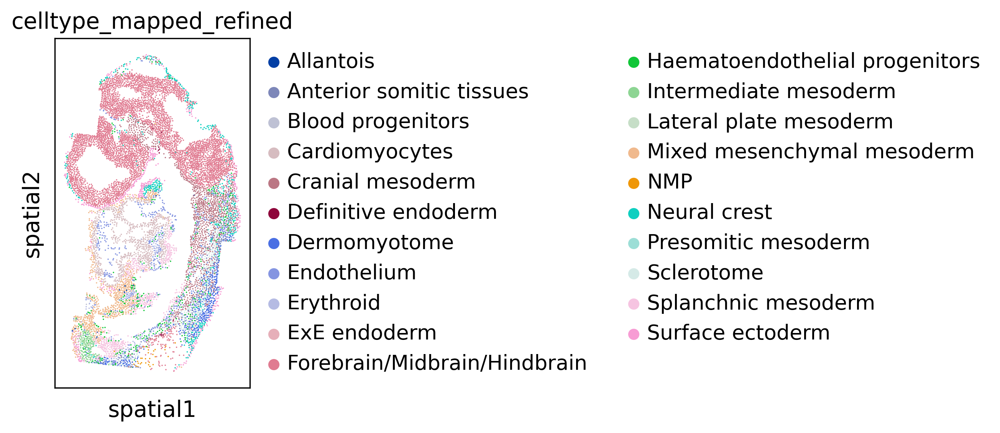

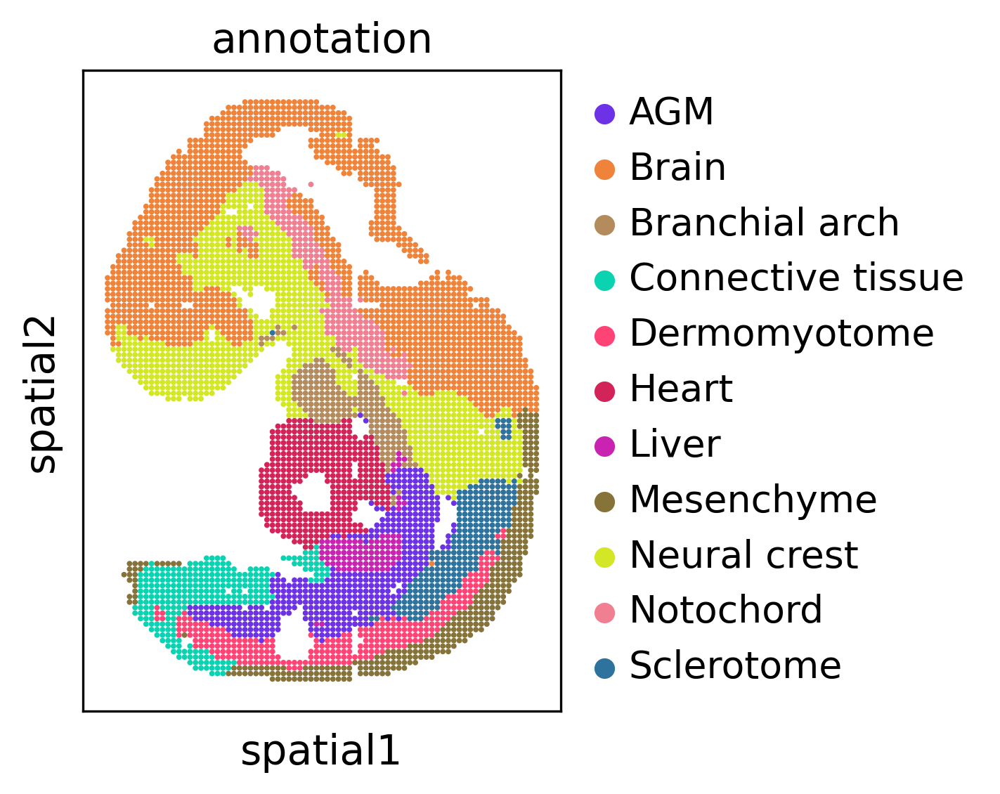

In [12]:
sc.pl.spatial(adata1_filter, spot_size=0.03, color='celltype_mapped_refined')
sc.pl.spatial(adata2, spot_size=1, color='annotation')

# run SLAT

In [13]:
np.unique(adata1_filter.var_names.isin(adata2.var_names), return_counts=True)

(array([False,  True]), array([  4, 347]))

In [14]:
Cal_Spatial_Net(adata1_filter, k_cutoff=50, model='KNN')
Cal_Spatial_Net(adata2, k_cutoff=25, model='KNN')

Calculating spatial neighbor graph ...
The graph contains 576450 edges, 11529 cells.
50.0000 neighbors per cell on average.
Calculating spatial neighbor graph ...
The graph contains 125775 edges, 5031 cells.
25.0000 neighbors per cell on average.


In [15]:
edges, features = load_anndatas([adata1_filter, adata2], feature='Harmony')
embd0, embd1, time = run_SLAT(features, edges, LGCN_layer=6, epochs=7, anchor_scale=1, batch_d_per_iter=7)

Use Harmony feature to format graph


/rd2/user/xiacr/SLAT/conda/lib/python3.8/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],
/rd2/user/xiacr/SLAT/conda/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
/rd2/user/xiacr/SLAT/conda/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  view_to_actual(adata)


Harmony is using GPU, which may lead to not duplicature result
Use GPU mode.
	Initialization is completed.
	Completed 1 / 30 iteration(s).
	Completed 2 / 30 iteration(s).
Reach convergence after 2 iteration(s).
Choose GPU:2 as device
Running
---------- epochs: 1 ----------
---------- epochs: 2 ----------
---------- epochs: 3 ----------
---------- epochs: 4 ----------
---------- epochs: 5 ----------
---------- epochs: 6 ----------
---------- epochs: 7 ----------
Training model time: 1.88


In [16]:
best, index, distance = spatial_match([embd0, embd1], adatas=[adata1_filter,adata2])

Smoothing mapping, make sure object is in same direction


In [17]:
adata1_df = pd.DataFrame({'index':range(embd0.shape[0]),
                          'x': adata1_filter.obsm['spatial'][:,0],
                          'y': adata1_filter.obsm['spatial'][:,1],
                          'celltype':adata1_filter.obs['celltype_mapped_refined'],
                          'Wnt3a':sc.get.obs_df(adata1_filter,'Wnt3a')})
adata2_df = pd.DataFrame({'index':range(embd1.shape[0]),
                          'x': adata2.obsm['spatial'][:,0],
                          'y': adata2.obsm['spatial'][:,1],
                          'celltype':adata2.obs['annotation'],
                          'Wnt3a':sc.get.obs_df(adata2,'Wnt3a')})

matching = np.array([range(index.shape[0]), best])
best_match = distance[:,0]
region_statistics(best_match,start=0.0,number_of_interval=20)

0.000~0.050         0          0.000%
0.050~0.100         0          0.000%
0.100~0.150         0          0.000%
0.150~0.200         0          0.000%
0.200~0.250         0          0.000%
0.250~0.300         2          0.040%
0.300~0.350        13          0.258%
0.350~0.400       104          2.067%
0.400~0.450       248          4.929%
0.450~0.500       369          7.335%
0.500~0.550       430          8.547%
0.550~0.600       433          8.607%
0.600~0.650       452          8.984%
0.650~0.700       568         11.290%
0.700~0.750       671         13.337%
0.750~0.800       721         14.331%
0.800~0.850       637         12.661%
0.850~0.900       349          6.937%
0.900~0.950        34          0.676%
0.950~1.000         0          0.000%


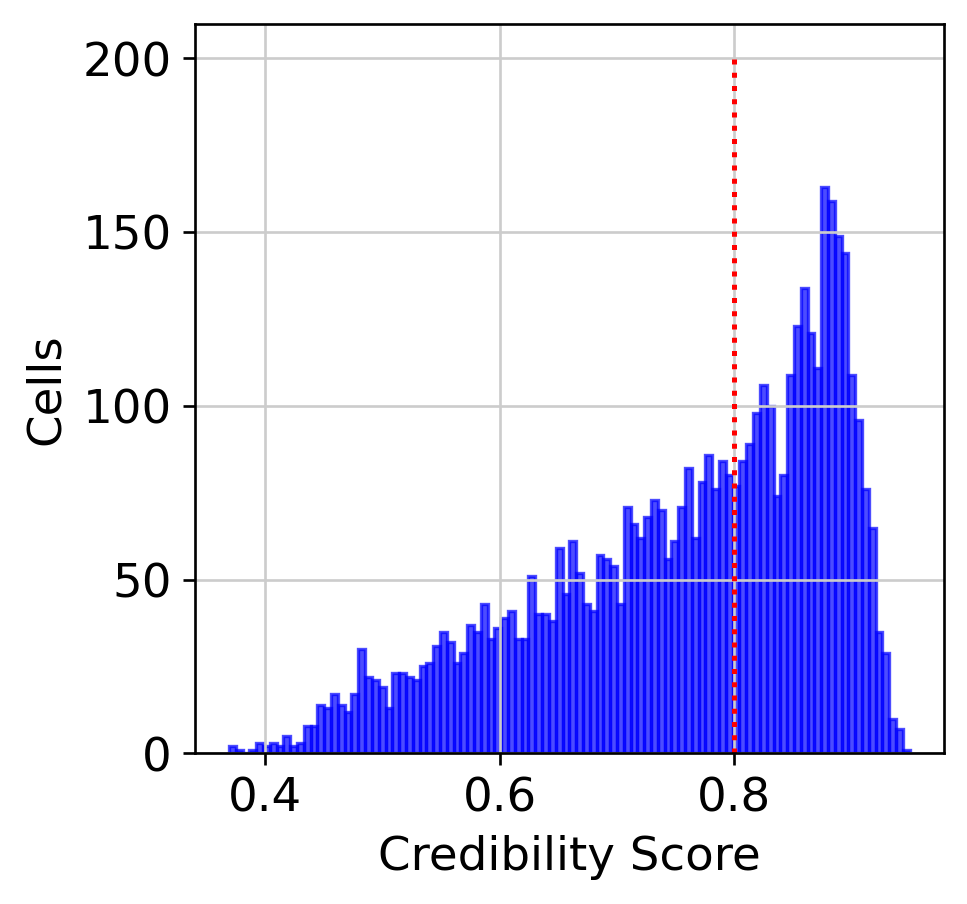

In [37]:
hist(best_match, cut=0.8)

/rd2/user/xiacr/SLAT/scSLAT/viz/multi_dataset.py:238: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  self.celltypes = set(self.dataset_A[meta].append(self.dataset_B[meta]))


dataset1: 21 cell types; dataset2: 11 cell types; 
                    Total :29 celltypes; Overlap: 3 cell types 
                    Not overlap :[['Intermediate mesoderm', 'Cranial mesoderm', 'Endothelium', 'ExE endoderm', 'NMP', 'Surface ectoderm', 'Anterior somitic tissues', 'Definitive endoderm', 'Blood progenitors', 'Splanchnic mesoderm', 'Mixed mesenchymal mesoderm', 'Cardiomyocytes', 'Presomitic mesoderm', 'Erythroid', 'Forebrain/Midbrain/Hindbrain', 'Lateral plate mesoderm', 'Haematoendothelial progenitors', 'Allantois', 'Brain', 'Notochord', 'Heart', 'AGM', 'Branchial arch', 'Connective tissue', 'Liver', 'Mesenchyme']]
Subsample 500 cell pairs from 5031


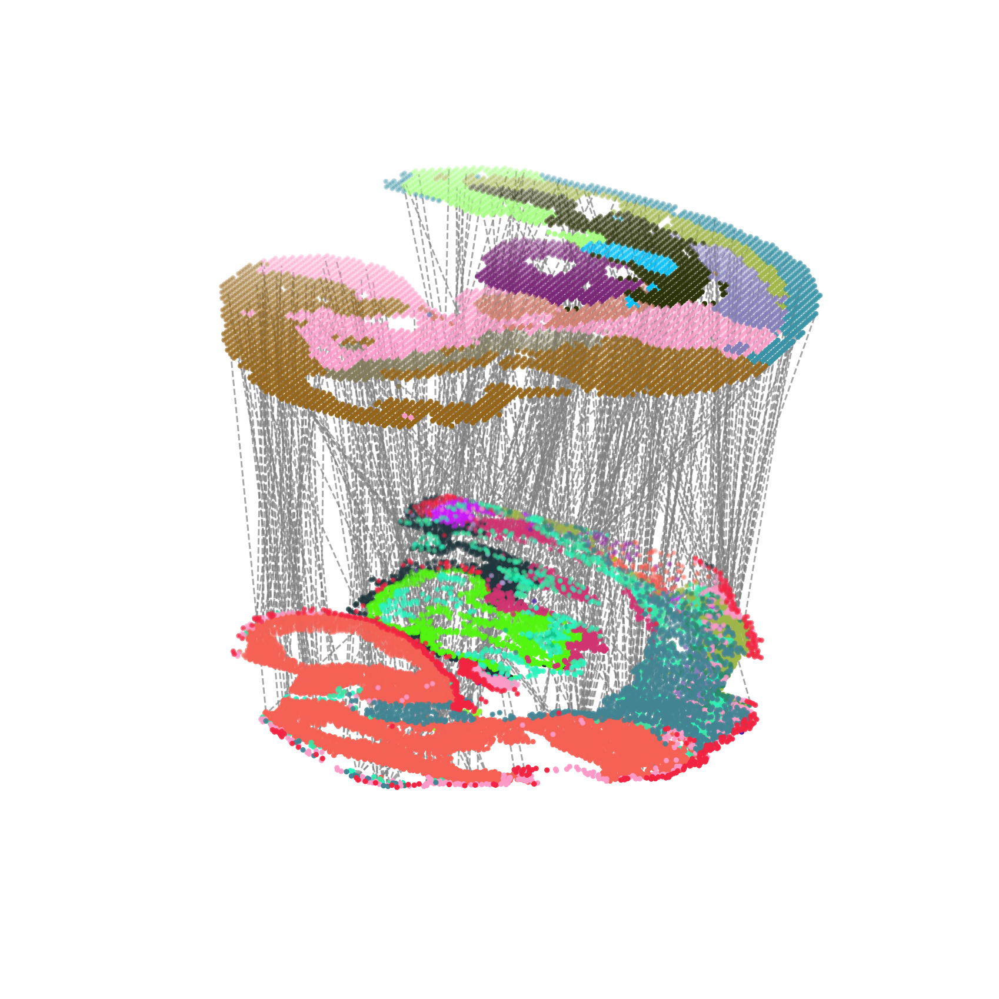

In [18]:
multi_align = match_3D_multi(adata1_df, adata2_df, matching, meta='celltype',
                             scale_coordinate=True, subsample_size=500, exchange_xy=False)

multi_align.draw_3D(size=[7, 8], line_width=0.7, line_color='grey', point_size=[1.5,1.5], 
                    hide_axis=True, show_error=False, save='./Alignment.png')

In [39]:
adata2.obs['low_quality_index']= best_match 
adata2.obs['low_quality_index'] = adata2.obs['low_quality_index'].astype(float)

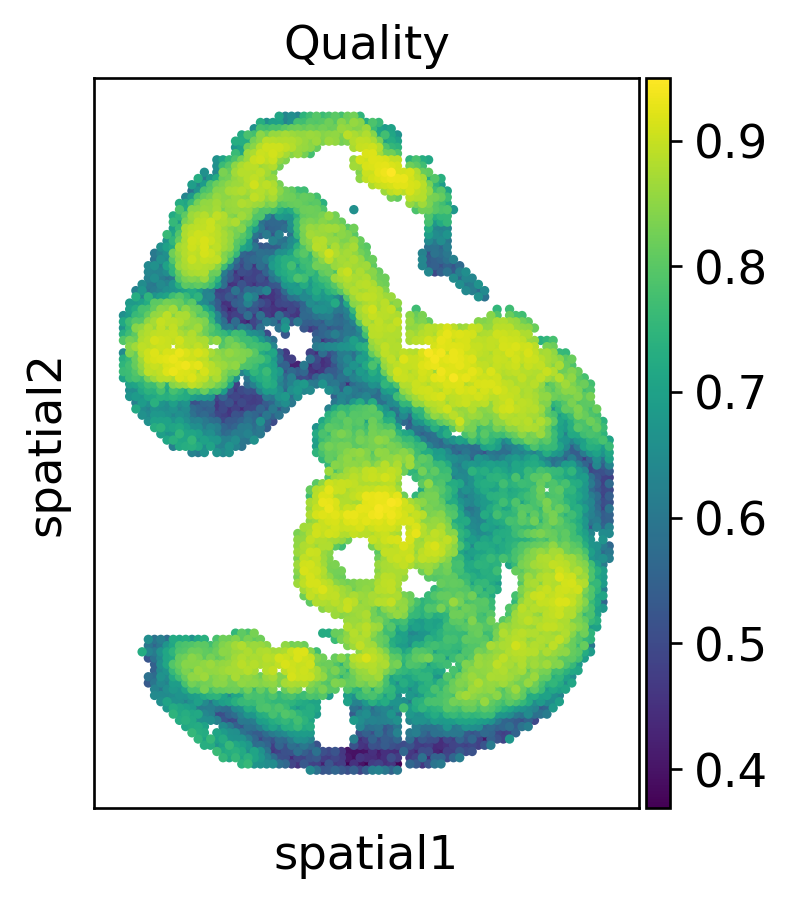

In [40]:
sc.pl.spatial(adata2, color='low_quality_index', spot_size=1.5, title='Quality')

In [42]:
matching_filter = matching[:, best_match > 0.8]

In [43]:
adata2_df['target_celltype'] = adata1_df.iloc[matching[1,:],:]['celltype'].to_list()
matching_table = adata2_df.groupby(['celltype','target_celltype']).size().unstack(fill_value=0)

In [44]:
matching_table = matching_table.loc[:, matching_table.columns != 'Low quality']

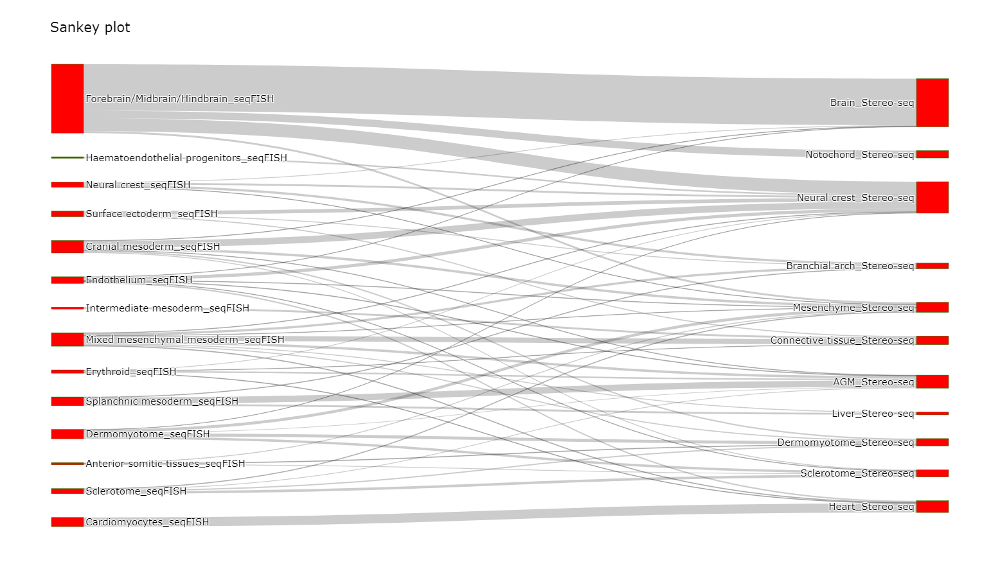

In [45]:
Sankey(matching_table, prefix=['seqFISH', 'Stereo-seq'])

/rd2/user/xiacr/spatialGLUE/Dragon/viz/multi_dataset.py:239: FutureWarning:

The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



dataset1: 21 cell types; dataset2: 11 cell types; 
                    Total :29 celltypes; Overlap: 3 cell types 
                    Not overlap :[['Anterior somitic tissues', 'Intermediate mesoderm', 'Definitive endoderm', 'Haematoendothelial progenitors', 'Allantois', 'Lateral plate mesoderm', 'Surface ectoderm', 'Splanchnic mesoderm', 'NMP', 'Endothelium', 'Cardiomyocytes', 'Forebrain/Midbrain/Hindbrain', 'Erythroid', 'Mixed mesenchymal mesoderm', 'Presomitic mesoderm', 'Blood progenitors', 'Cranial mesoderm', 'ExE endoderm', 'Brain', 'Notochord', 'Heart', 'Connective tissue', 'Mesenchyme', 'Liver', 'AGM', 'Branchial arch']]
Subsample 2000 cell pairs from 3534


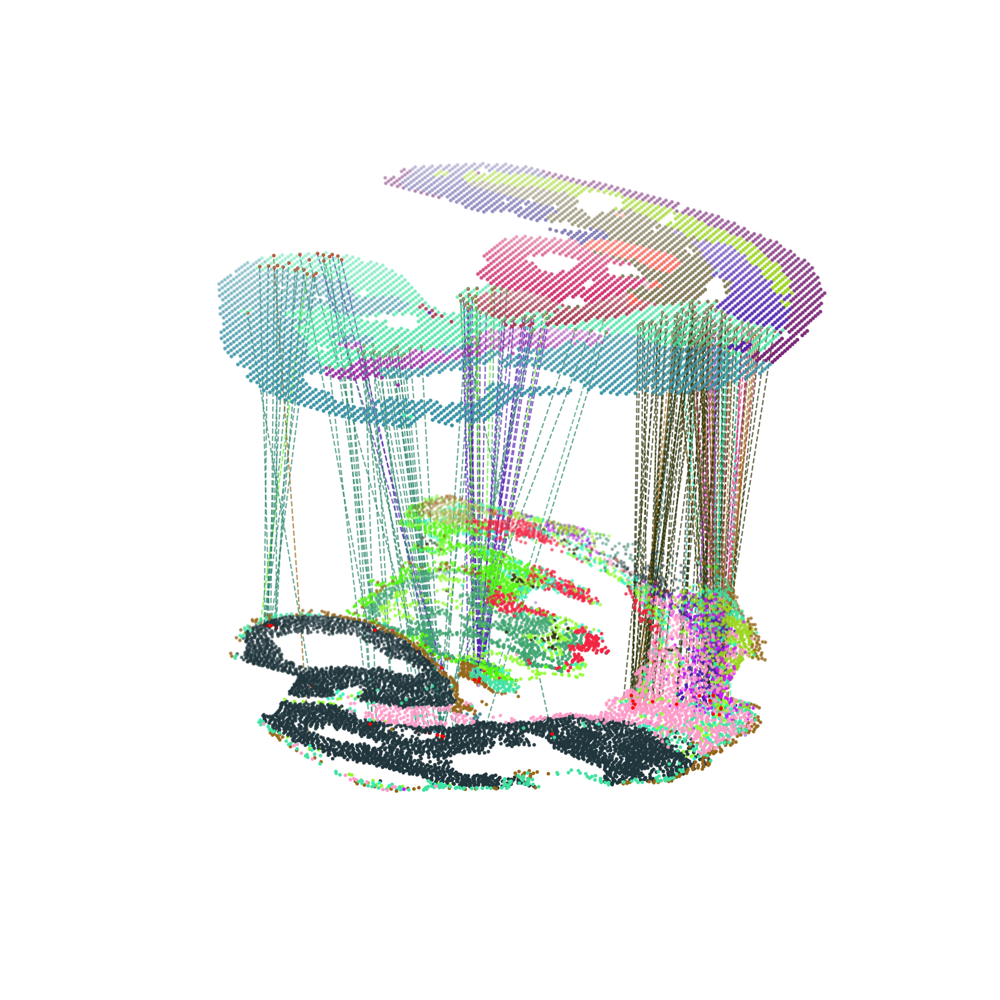

In [138]:
test = match_3D_celltype(adata1_df, adata2_df, matching[:, best_match > 0.7], meta='celltype', highlight_celltype=[list(set(adata1_df.celltype)),['Neural crest']],
                         subsample_size=2000, highlight_cell=['red'], scale_coordinate=True)
test.draw_3D(size=[10, 12], line_width=0.8, point_size=[1.2,1.5], hide_axis=True)

# Neural crest anno case

In [121]:
# adata2_df.celltype=='Neural crest' & adata2_df.target_celltype!='Low quality'
idx = np.where((adata2_df.celltype=='Neural crest') & (adata2_df.target_celltype!='Low quality') & (adata2.obs.low_quality_index > 0.7))

In [122]:
adata2.obs['target_celltype'] = adata1_df.iloc[matching[1,:],:]['celltype'].to_list()

/rd2/user/xiacr/spatialGLUE/Dragon/model/utils.py:607: FutureWarning:

X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.



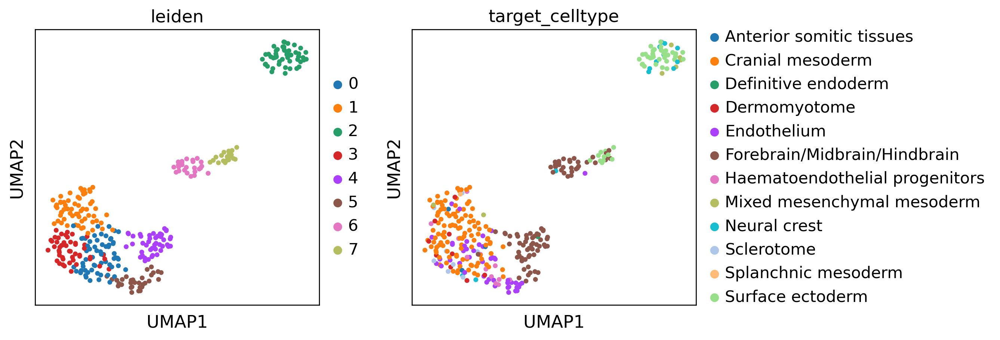

In [181]:
neural_crest = adata2[idx[0],:]
neural_crest = scanpy_workflow(neural_crest, n_comps=20)
sc.pp.neighbors(neural_crest, metric="cosine")
sc.tl.leiden(neural_crest, resolution=1)
sc.tl.umap(neural_crest)
sc.pl.umap(neural_crest, color=['leiden','target_celltype'], size=60)

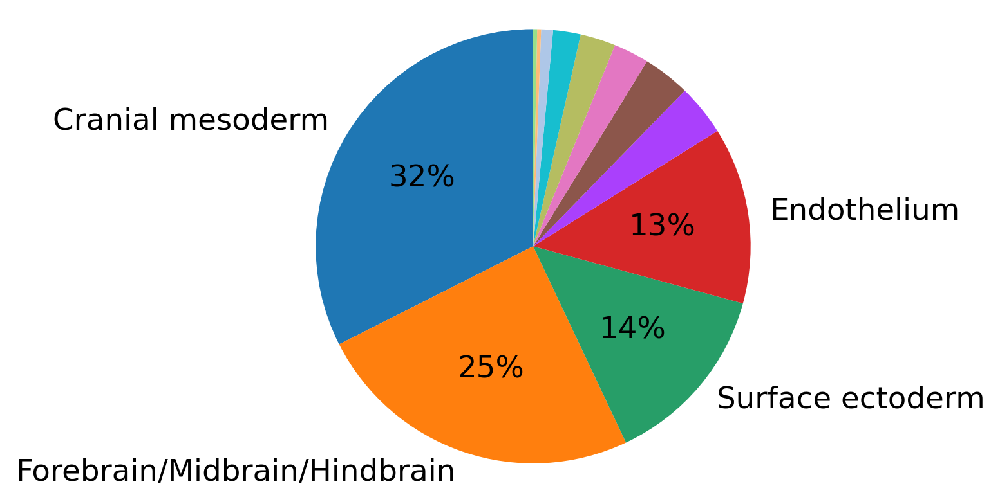

In [124]:
# Pie chart, where the slices will be ordered and plotted counter-clockwise:
labels =  neural_crest.obs.target_celltype.value_counts().index.values
sizes = neural_crest.obs.target_celltype.value_counts().values
explode = (0, 0.1, 0, 0)  # only "explode" the 2nd slice (i.e. 'Hogs')
labels = [n if v > sizes.sum() * 0.05 else '' for n, v in zip(labels, sizes)]  

def autopct_more_than_1(pct):
    return ('%1.f%%' % pct) if pct > 5 else ''

fig1, ax1 = plt.subplots()
ax1.pie(sizes, labels=labels, autopct=autopct_more_than_1,
        shadow=False, startangle=90)
ax1.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

plt.show()

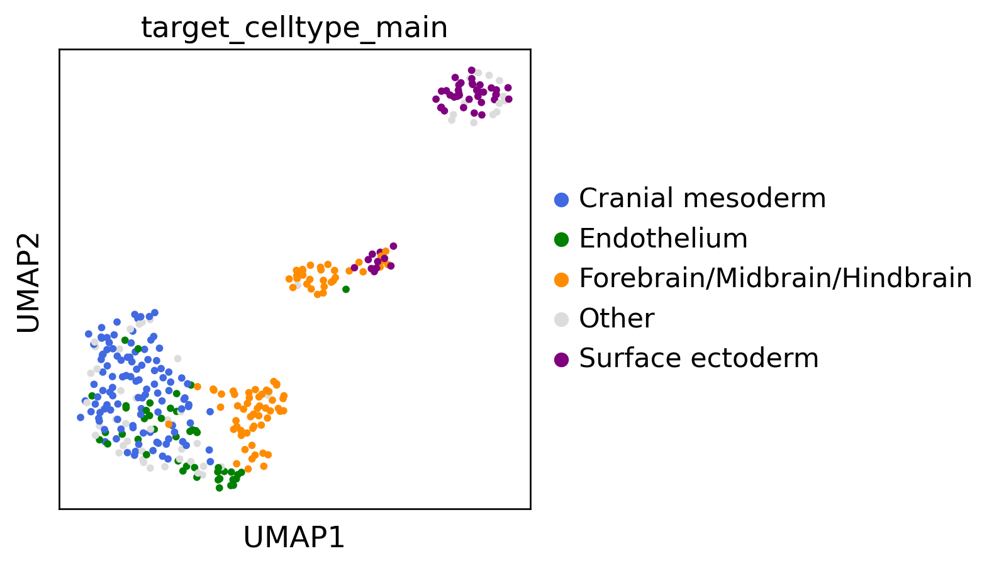

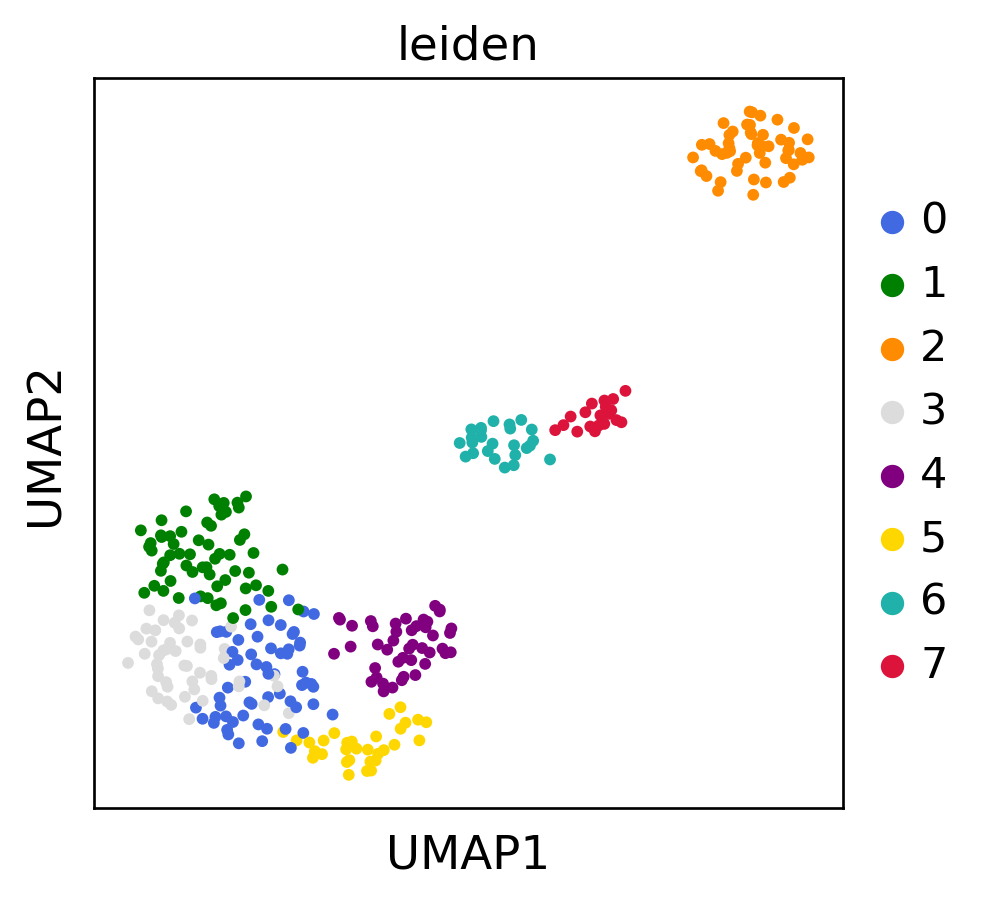

In [180]:
neural_crest.obs['target_celltype_main'] = neural_crest.obs['target_celltype'].tolist()
neural_crest.obs.loc[~adata2.obs.target_celltype.isin(labels), 'target_celltype_main'] = 'Other'
sc.pl.umap(neural_crest, color=['target_celltype_main'], size=50, wspace=0.9, palette=['#4169E1','green','#FF8C00','#DCDCDC','purple'])
sc.pl.umap(neural_crest, color=['leiden'], size=50, wspace=0.9, palette=['#4169E1','green','#FF8C00','#DCDCDC','purple','#FFD700','#20B2AA','#DC143C'])

In [182]:
# annotation
neural_crest.obs['re_anno'] = 'unknown'
neural_crest.obs.loc[neural_crest.obs.leiden.isin(['0','1','3','5']),'re_anno'] = 'Mesoderm'
neural_crest.obs.loc[neural_crest.obs.leiden.isin(['4','6']),'re_anno'] = 'Neuron ectoderm'
neural_crest.obs.loc[neural_crest.obs.leiden.isin(['2','7']),'re_anno'] = 'Ectoderm'

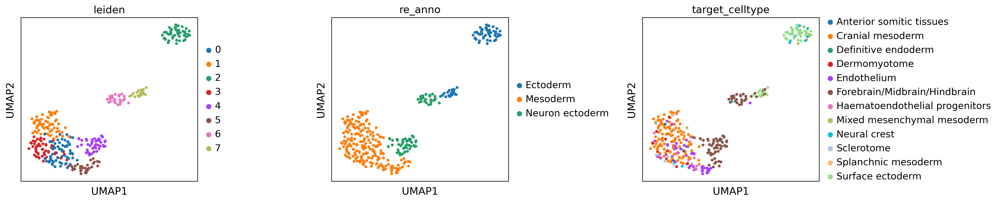

In [188]:
sc.pl.umap(neural_crest, color=['leiden','re_anno','target_celltype'],wspace=0.6, ncols=3, size=60)

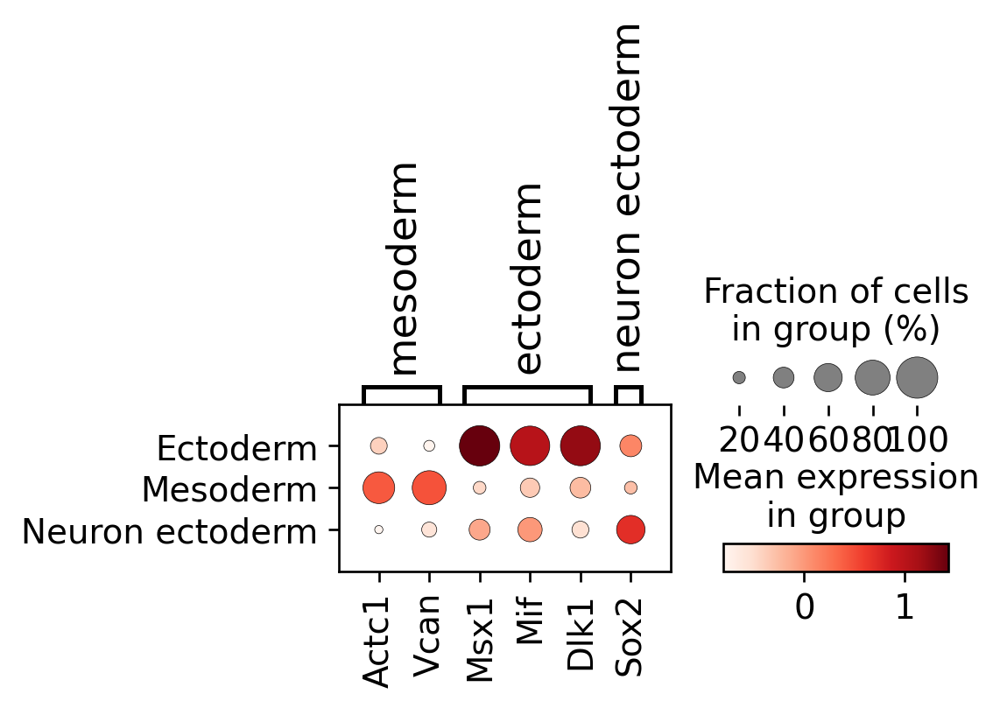

In [193]:
p = sc.pl.dotplot(neural_crest, 
              var_names={'mesoderm':['Actc1','Vcan'],
                        'ectoderm':['Msx1','Mif','Dlk1'],
                        'neuron ectoderm':['Sox2'],
                        },
              groupby='re_anno')

In [229]:
neural_crest.write_h5ad('neural_crest.h5ad')
adata1_filter.write_h5ad('seqFISH_filer.h5ad')
adata2.write_h5ad('Stereo_filer.h5ad')

In [231]:
np.savetxt('./SLAT_matching.csv', matching,delimiter=',')